# Traffic lane marking detection
In this assignment, you will use image processing techniques and the Hough Transform to identify traffic lane markings in a series of test images. \
There are 5 sets of images in total. Start with set 1, and then review the other sets (some are more difficult than others)


## Submission Details
Assignment deadline: 11:59 pm on Sunday 26th November \
Jupyter Notebook containing submission to be submitted via Canvas \
Total grade: 20% of final module mark \
Submit the assignment as a notebook (i.e. .iynb file) \
Use the following format for your filename: firstname_lastname_assignment3.ipynb

# Submission details
### Name: Sai Manoj Kumar Penikalapati
### ID: 25241477
### Class code: EE551

In [1]:
# install required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import random
%matplotlib inline


## Load test images


In [2]:
# Common Functions Used

def plot_images(images, gray_scale = False):
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))

    axs = axs.ravel()
    
    for i in range(5):
        if (gray_scale):
            axs[i].imshow(images[i], cmap=plt.get_cmap('gray'))
        else:
            axs[i].imshow(images[i])
        axs[i].axis('off')
    
    plt.tight_layout()
    plt.show();

def image_generator(in_imgs, gen):
    out_imgs = [gen(in_imgs[i]) for i in range(5)] 
    return out_imgs

In [3]:
# read images
def image_reader(path):
    filenames = [path + filename for filename in os.listdir(path)]
    raw_images = [cv2.imread(filename) for filename in filenames]

    return raw_images

raw_images_1 = image_reader('images/set_1/')
raw_images_2 = image_reader('images/set_2/')
raw_images_3 = image_reader('images/set_3/')
raw_images_4 = image_reader('images/set_4/')
raw_images_5 = image_reader('images/set_5/')

## Convert the images to greyscale

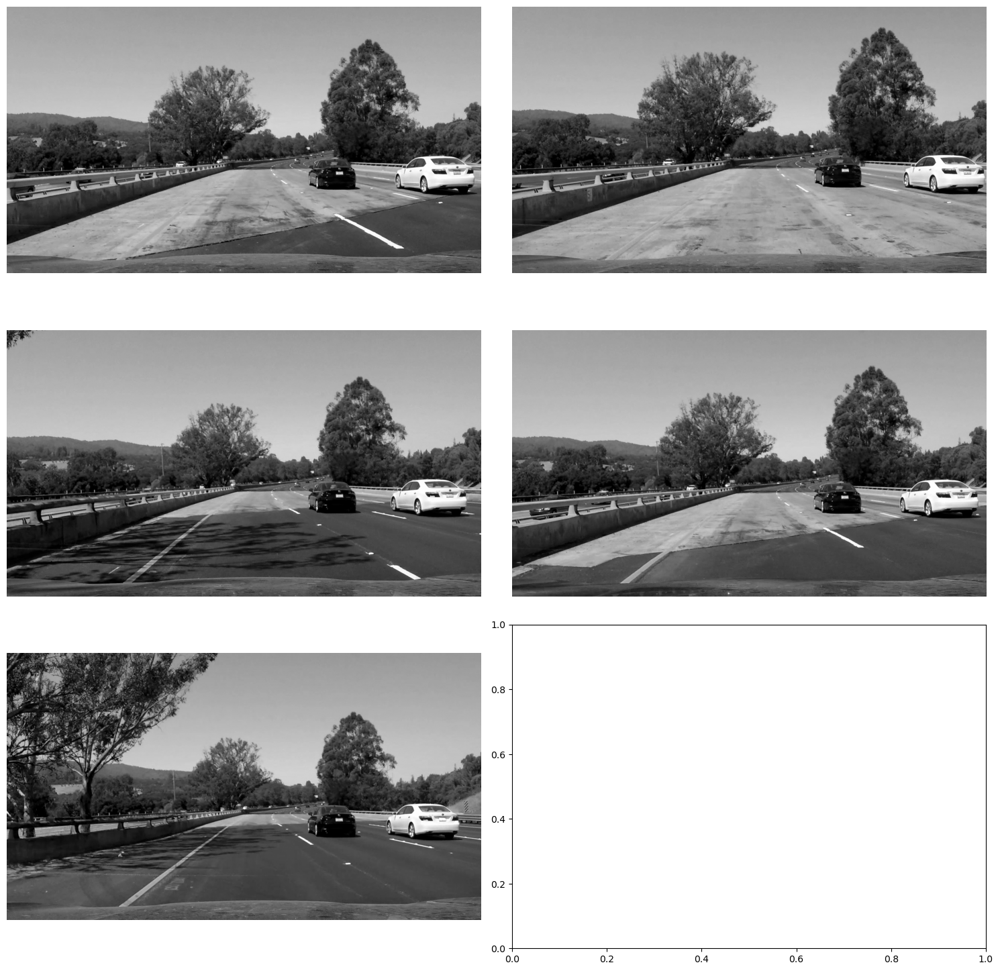

In [4]:
# take all the images in the list and create a list of greyscale images

grey_images = []

# code: populate grey_images as a list of greyscale images
def gray_img_gen(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

grey_images_1 = image_generator(raw_images_1, gray_img_gen)
grey_images_2 = image_generator(raw_images_2, gray_img_gen)
grey_images_3 = image_generator(raw_images_3, gray_img_gen)
grey_images_4 = image_generator(raw_images_4, gray_img_gen)
grey_images_5 = image_generator(raw_images_5, gray_img_gen)

# plot the image to confirm 
plot_images(grey_images_5, True);

## Apply Gaussian blur
Gaussian blur reduces noise and weak edges. In principle, only sharper, more defined edges (i.e. road markings) will remain\

The image should look something like this:
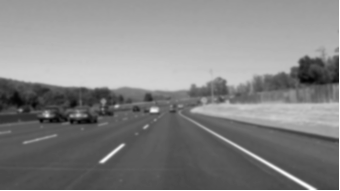

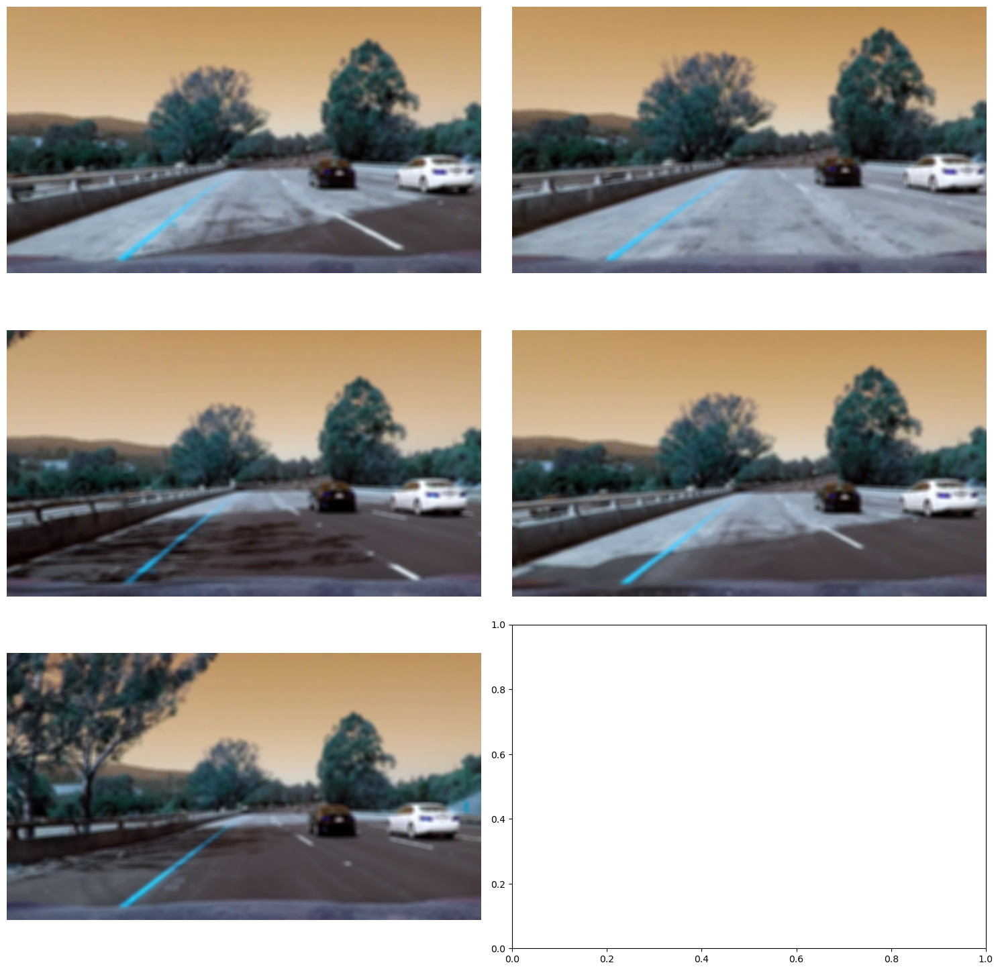

In [5]:
# define the blur kernel size. Hint: a kernel size of 15 works fairly well
kernel_size = 15

blur_images = []

# blur all of the images with opencv's gaussian blur function and populate the blur_images list with the results

def blur_img_gen(img, kernel_size):
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def blur_img_gen_5(img, kernel_size):
    return cv2.GaussianBlur(img, ksize=(kernel_size, kernel_size), sigmaX=9)

blur_images_1 = image_generator(grey_images_1, lambda img : blur_img_gen(img, 15))
blur_images_2 = image_generator(grey_images_2, lambda img : blur_img_gen(img, 15))
blur_images_3 = image_generator(grey_images_3, lambda img : blur_img_gen(img, 15))
blur_images_4 = image_generator(grey_images_4, lambda img : blur_img_gen(img, 11))
blur_images_5 = image_generator(raw_images_5, lambda img : blur_img_gen_5(img, 15))
    
#display blurred images
plot_images(blur_images_5, True)

## Comments on Blurring the image

- For the first 3 sets, I took the kernel size 15, sigma 0 which worked well 
- For the 4th set, I took the kernel size 11, sigma 0 because the details are getting lost after edge detection
- For the 5th set, I took the sigmaX as 9 because i wanted strong blur to remove the disturbance caused by the shadows and road surfaces in the images

## Detect edges
The next step is to detect edges in the image. In general, the Canny edge detector works well for this operation\

The result should look something like this:
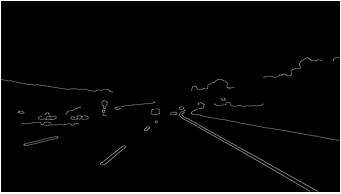

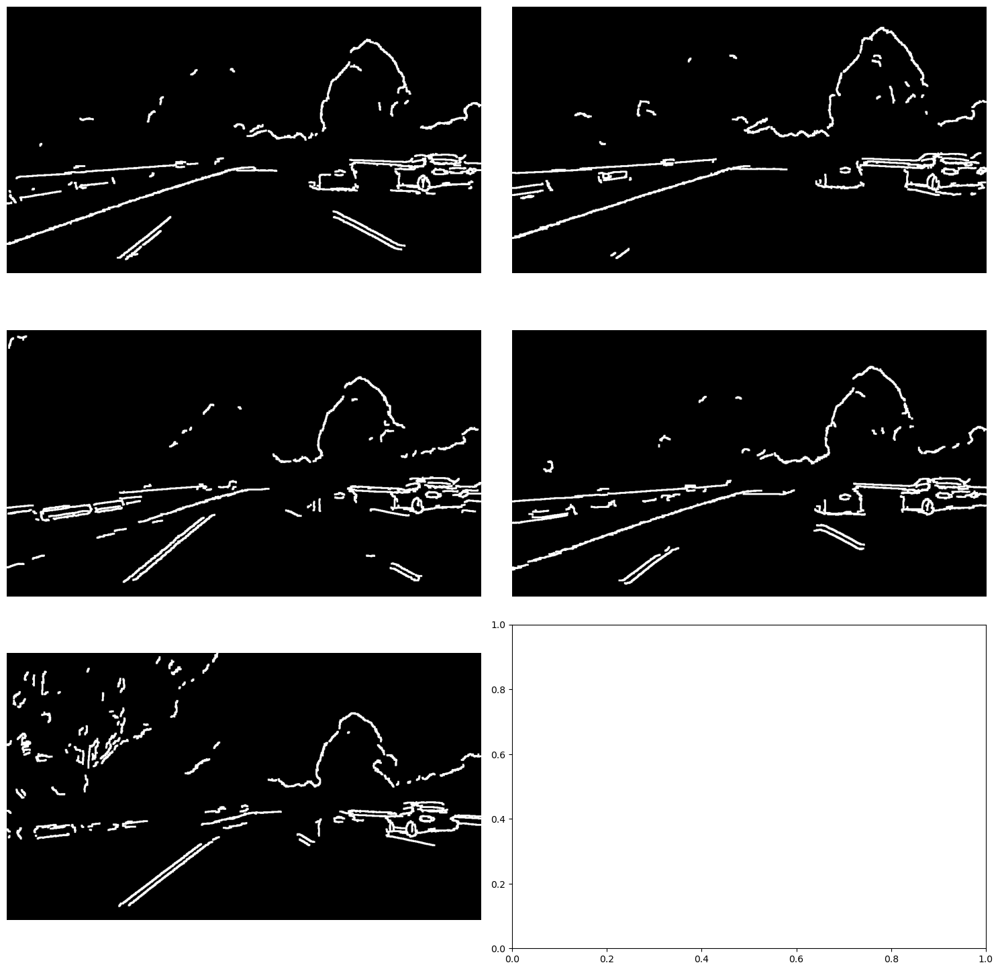

In [6]:
# define edge thresholds. Note: these thresholds may need to be adjusted for different scenarios.
# hint: 20 and 100 work well for the first set (but not necessarily all...)

# apply edge detection to the blur_images list of images

def edge_img_gen(img, canny_low_threshold, canny_high_threshold):
    edges = cv2.Canny(img, canny_low_threshold, canny_high_threshold)
    return edges 

def canny_edge_gen(img, canny_low_threshold, canny_high_threshold):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(5, 5))
    
    edge = cv2.Canny(img, canny_low_threshold, canny_high_threshold, apertureSize=3)
    edge = cv2.dilate(edge,kernel,iterations = 1)

    return edge

canny_images_1 = image_generator(blur_images_1, lambda img: edge_img_gen(img, 20, 100))
canny_images_2 = image_generator(blur_images_2, lambda img: edge_img_gen(img, 20, 100))
canny_images_3 = image_generator(blur_images_3, lambda img: edge_img_gen(img, 20, 100))
canny_images_4 = image_generator(blur_images_4, lambda img: edge_img_gen(img, 20, 89))
canny_images_5 = image_generator(blur_images_5, lambda img: canny_edge_gen(img, 10, 100))

#display edge images
plot_images(canny_images_5, True)

## Comments on Canny Edge Detection

- For the first 3 sets the recommended thresholds (20, 100) worked well in detecting edges.
- For the 4th set, I reduced the high threshold value to 89, because for 100 the lanes are not getting detected in some images.
- For the 5th set, I reduced the low threshold value to 10 for better edge detection at lanes and dilated the image for better visuality.

## Define region of interest
We only want to look for edges in the road in front of the camera, and we want to ignore edges in the sky, background etc. To do this, we will define a region of interest. All edges outside the region of interest are ignored

The result should look something like this example, where most of the background has been ignored:
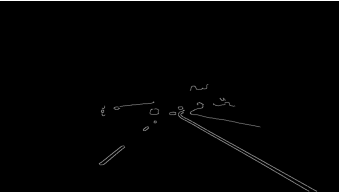


In [7]:
# Note: use this code as is, there is no need to change

# define a region of interest mask
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon defined by "vertices". 
    The rest of the image is set to black.
    """
    #define a blank mask
    mask = np.zeros_like(img)   
    
    #define a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

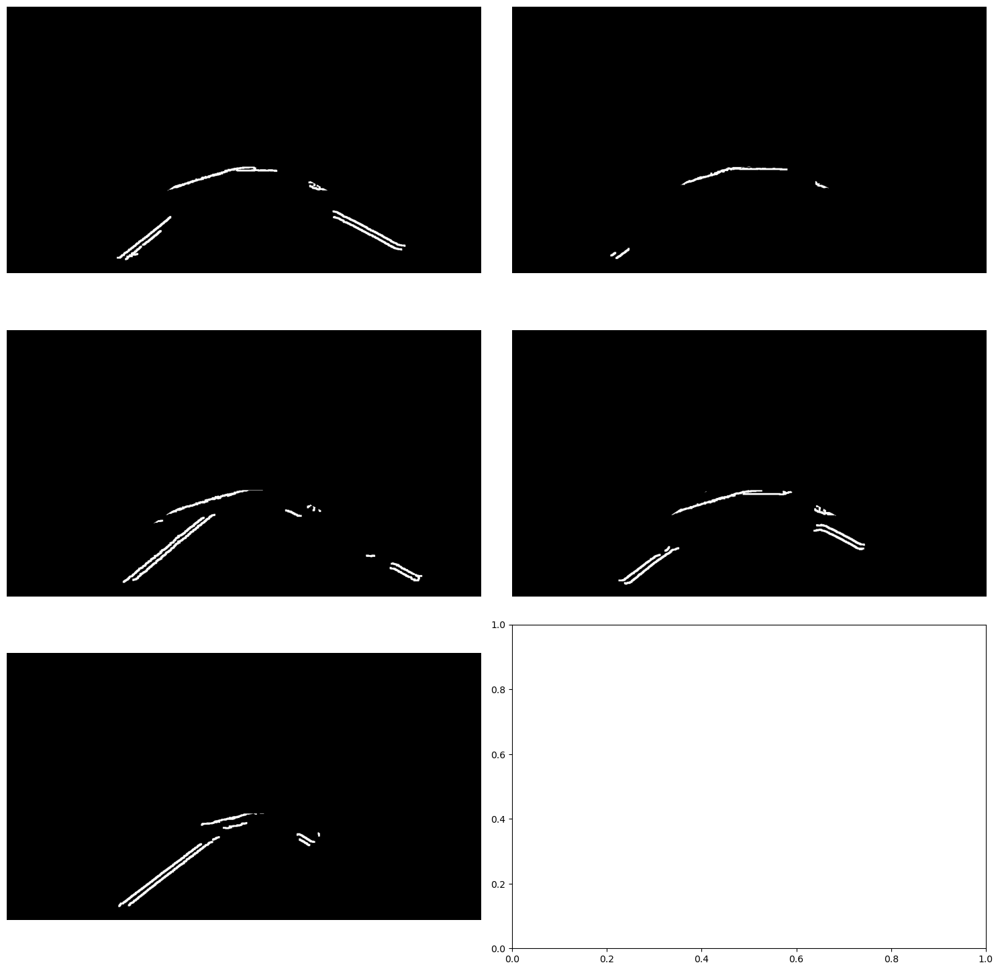

In [8]:
# get the size and shape of one of the images
ysize_1 = raw_images_1[0].shape[0]
xsize_1 = raw_images_1[0].shape[1]

ysize_2 = raw_images_2[0].shape[0]
xsize_2 = raw_images_2[0].shape[1]

ysize_3 = raw_images_3[0].shape[0]
xsize_3 = raw_images_3[0].shape[1]

ysize_4 = raw_images_4[0].shape[0]
xsize_4 = raw_images_4[0].shape[1]

ysize_5 = raw_images_5[0].shape[0]
xsize_5 = raw_images_5[0].shape[1]

# define region of interest. The region of interest should include the road area and ignore the background
# the coordinates will need to be changed, depending on the image set used, as the field of view will be different
# define the region as a numpy array, of type np.int32

# set 1
region_1 = np.array([
    [int(0.1 * xsize_1), int(1 * ysize_1)],
    [int(0.45 * xsize_1), int(0.6 * ysize_1)],
    [int(0.55 * xsize_1), int(0.6 * ysize_1)],
    [int(1 * xsize_1), int(1 * ysize_1)]
], dtype=np.int32)

# set 2
region_2 = np.array([
    [int(0.1 * xsize_2), int(1 * ysize_2)],
    [int(0.45 * xsize_2), int(0.3 * ysize_2)],
    [int(0.55 * xsize_2), int(0.3 * ysize_2)],
    [int(1 * xsize_2), int(1 * ysize_2)]
], dtype=np.int32)

# set 3
region_3 = np.array([
    [int(0.1 * xsize_3), int(1 * ysize_3)],
    [int(0.48 * xsize_3), int(0.35 * ysize_3)],
    [int(0.52 * xsize_3), int(0.35 * ysize_3)],
    [int(1 * xsize_3), int(1 * ysize_3)]
], dtype=np.int32)

# set 4
region_4 = np.array([
    [int(0.1 * xsize_4), int(0.7 * ysize_4)],
    [int(0.45 * xsize_4), int(0.42 * ysize_4)],
    [int(0.65 * xsize_4), int(0.42 * ysize_4)],
    [int(0.75 * xsize_4), int(0.75 * ysize_4)]
], dtype=np.int32)

# set 5
region_5 = np.array([
    [125, 706],
    [525, 435],
    [744, 432],
    [1280, 720]
], dtype=np.int32)

# apply the mask to the Canny edge images
masked_images_1 = [region_of_interest(img,[region_1]) for img in canny_images_1]
masked_images_2 = [region_of_interest(img,[region_2]) for img in canny_images_2]
masked_images_3 = [region_of_interest(img,[region_3]) for img in canny_images_3]
masked_images_4 = [region_of_interest(img,[region_4]) for img in canny_images_4]
masked_images_5 = [region_of_interest(img,[region_5]) for img in canny_images_5]

#display ROI images
plot_images(masked_images_5, True)

## Comments on Region of Interest Detection

- This is the most demanding task of all in this assignment.
- Finding the right co-ordinates for the ideal trapezium to detect the lanes requires more trial and error which is inefficient in real case scenarios
- The most irritating part is even if you find the correct co-ordinates if you have some noise or unneccessary white points in the image, broken lines, most of the time the lane is not detected correctly. [mostly in case of set 4 and set 5 images]
- The lines are formed somewhere else instead of lanes in set 4,  set 5 most of the times.
- I had to use different co-ordinates for different sets as one polygon doesn't work for all kinds of images.

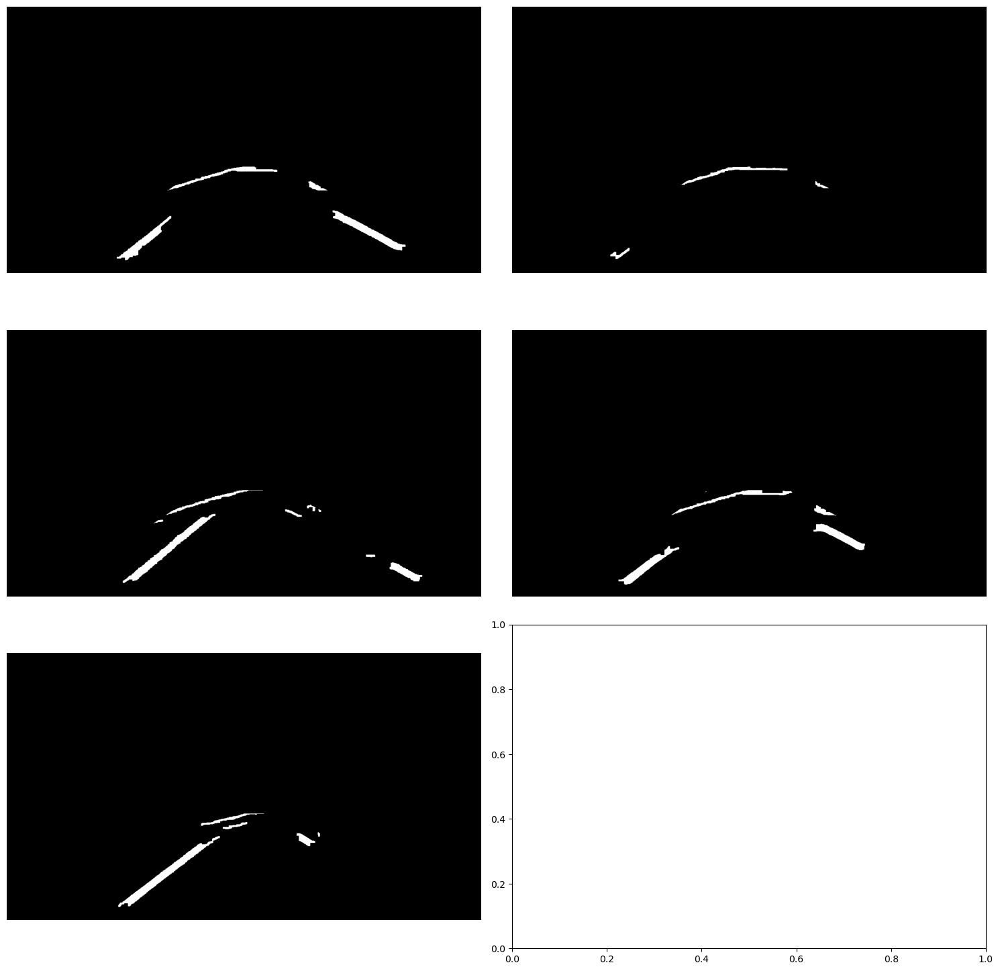

In [9]:
# erosion function [do this only for set 4, set 5] NO NEED FOR SETS 1,2,3
def dilate_erode_img_gen_5(img):
    
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)) 
    closed_img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    edge = cv2.dilate(closed_img, kernel, iterations=2)
    edge = cv2.erode(edge, kernel, iterations=2)
    
    return edge

def dilate_erode_img_gen_4(img):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))
    closed_img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

    return closed_img

req_images_4 = image_generator(masked_images_4, dilate_erode_img_gen_4)
req_images_5 = image_generator(masked_images_5, dilate_erode_img_gen_5)

plot_images(req_images_5, True)

## Comments on Extra step (Erosion, Dilation) taken for set 4, set 5 images

- I encountered a lot of broken lines in the lane detection for set 4 , set 5 images even after removal of moise and disturbances in the image.
- So, I dilated the images for the broken lines to combine to a single block and eroded it to form a single line of some thickness.
- This made it easier in detecting the lanes for these sets.

## Apply Hough Transform
We will use the Hough Transform to detect lines in the image

You should expect to see something that looks like this:
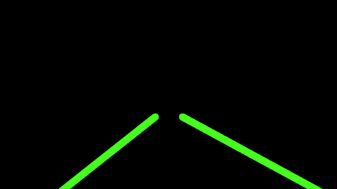

In [10]:
# Define helper function to draw the lines detected by the Hough Transform
# These functions can be used as is, however, modify/update the code as you may require. Some examples could include adaptive line length, curved lines, etc.


# helper function - fit a line to the Hough tranform coordinates, and plot on the image
def drawLine(img, x, y, color=[0, 255, 0], thickness=20, choice=2):
    if len(x) == 0: 
        return
    
    lineParameters = np.polyfit(x, y, 1) 
    
    m = lineParameters[0]
    b = lineParameters[1]
    
    maxY = img.shape[0]
    maxX = img.shape[1]
    y1 = maxY
    x1 = int((y1 - b)/m)

    y2 = int((maxY/choice)) # note: hardcoded, sets the length of the line to half the image height + 60 pixels [set 1]
        
    x2 = int((y2 - b)/m)
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)


# Helper function - split the detected lines into left and right lines
def draw_lines(img, lines, color=[0, 255, 0], thickness=20, choice=2):

    leftPointsX = []
    leftPointsY = []
    rightPointsX = []
    rightPointsY = []

    for line in lines:
        for x1,y1,x2,y2 in line:
            m = (y1 - y2)/(x1 - x2 + 1e-6)

                        
            if m < 0:
                leftPointsX.append(x1)
                leftPointsY.append(y1)
                leftPointsX.append(x2)
                leftPointsY.append(y2)
            else:
                rightPointsX.append(x1)
                rightPointsY.append(y1)
                rightPointsX.append(x2)
                rightPointsY.append(y2)

    drawLine(img, leftPointsX, leftPointsY, color, thickness, choice)
        
    drawLine(img, rightPointsX, rightPointsY, color, thickness, choice)



## Comments on changes made in draw_lines function

- The y2 co-ordinate was hardcoded in the function as it detects lanes only for 50% of the image.
- This works for set 1 and set 5 images as the lanes cover only 50% of the image.
- For the remaining sets the lane covers 70% to 80% of the image. For these sets the lane is detected only half-way.
- Made changes so I can manipluate this accordingly for all the sets 

In [11]:
# define a function - calculate Hough lines based on the Canny images, and draw them on the output image

# use the opencv cv2.HoughLinesP to calculate the Hough lines in the image (i.e. to detect the lanes)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap, choice=2):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, min_line_len, max_line_gap) # insert your code here
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines, [0, 255, 0], 20, choice)
    return line_img

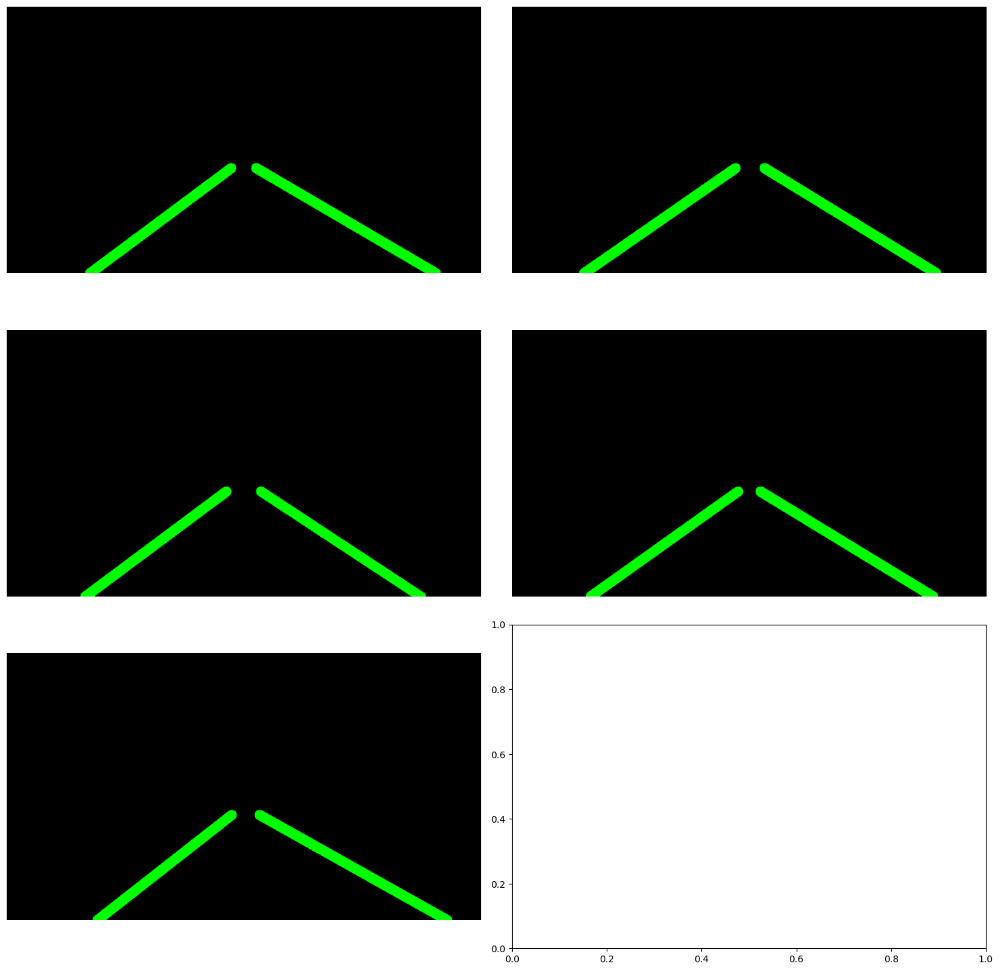

In [29]:
# define the parameters for the Hough line detector. The default values work reasonably well

rho = 1 # distance resolution in pixels of the Hough grid 1
theta = np.pi/180 # angular resolution in radians of the Hough grid np.pi/180

# set 1, set 2 -> 20 | set 3, set 4 -> 30 | set 5 -> 30, 50, 5
threshold = 30     # minimum number of votes (intersections in Hough grid cell) 10
min_line_length = 20 # minimum number of pixels making up a line 20
max_line_gap = 1    # maximum gap in pixels between connectable line segments 1

hough_images_1 = [hough_lines(img,rho,theta,20,min_line_length,max_line_gap, 1.65) for img in masked_images_1] 
hough_images_2 = [hough_lines(img,rho,theta,20,min_line_length,max_line_gap, 2.5) for img in masked_images_2] 
hough_images_3 = [hough_lines(img,rho,theta,30,min_line_length,max_line_gap, 2.5) for img in masked_images_3] 
hough_images_4 = [hough_lines(img,rho,theta,20,min_line_length,10, 2.5) for img in req_images_4] 
hough_images_5 = [hough_lines(img,rho,theta,30,min_line_length,20,1.57) for img in req_images_5] 

#display Hough line images
plot_images(hough_images_1, True)

## Comments on Lane Detection (Hough Lines Parameters)

- This part was a bit tricky, I had to choose a combination of threshold and max_line_gap values for the lane detection to work properly for some images.
- For threshold 10, it is detecting unneccessary noisy lines instead of the main lane, so I increased it accordingly to 20 or 30 for the given sets accordingly.
- For set 4, set 5 images the lanes are detected but broken into multiple parts. It was not a single continuous line.
- For low max_line_gap, they were treated as seperate lines and this caused issues in detection. So, I increased it to 10, 20 accordingly.

## Plot the Hough Lines on the original images
Now that we have detected the lines, we will overlay them on the original images.

Bringing it all together:

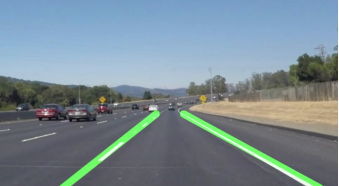

Note: In your *submitted* Jupyter Notebook, in this section you should include graphs of all images in the 5 test sets, with the "overlay" of the detected lane markings on the original image (up to 25 images). 
For the intermediate stages of processing, it is sufficient to include plots of two test images, one "easy" and one "hard" in your submitted notebook. However, during development of your code, you will of course need to test all 25 test images to make sure your algorithm is working correctly.  

In [30]:
# define variables for merging
α=0.8
β=1.0 
λ=0.0

# use the addWeighted function to overlay the Hough lines onto the original image

def final_img_gen(hough_images, raw_images):
    final_images = list()
    for i in range(len(hough_images)):
        # insert code here. Use cv2.addWeighted to merge the Hough line images to the original image
        final_images.append(cv2.addWeighted(raw_images[i], α, hough_images[i], β, λ))

    return final_images

final_images_1 = final_img_gen(hough_images_1, raw_images_1)
final_images_2 = final_img_gen(hough_images_2, raw_images_2)
final_images_3 = final_img_gen(hough_images_3, raw_images_3)
final_images_4 = final_img_gen(hough_images_4, raw_images_4)
final_images_5 = final_img_gen(hough_images_5, raw_images_5)

# Lane Detected Images for each set

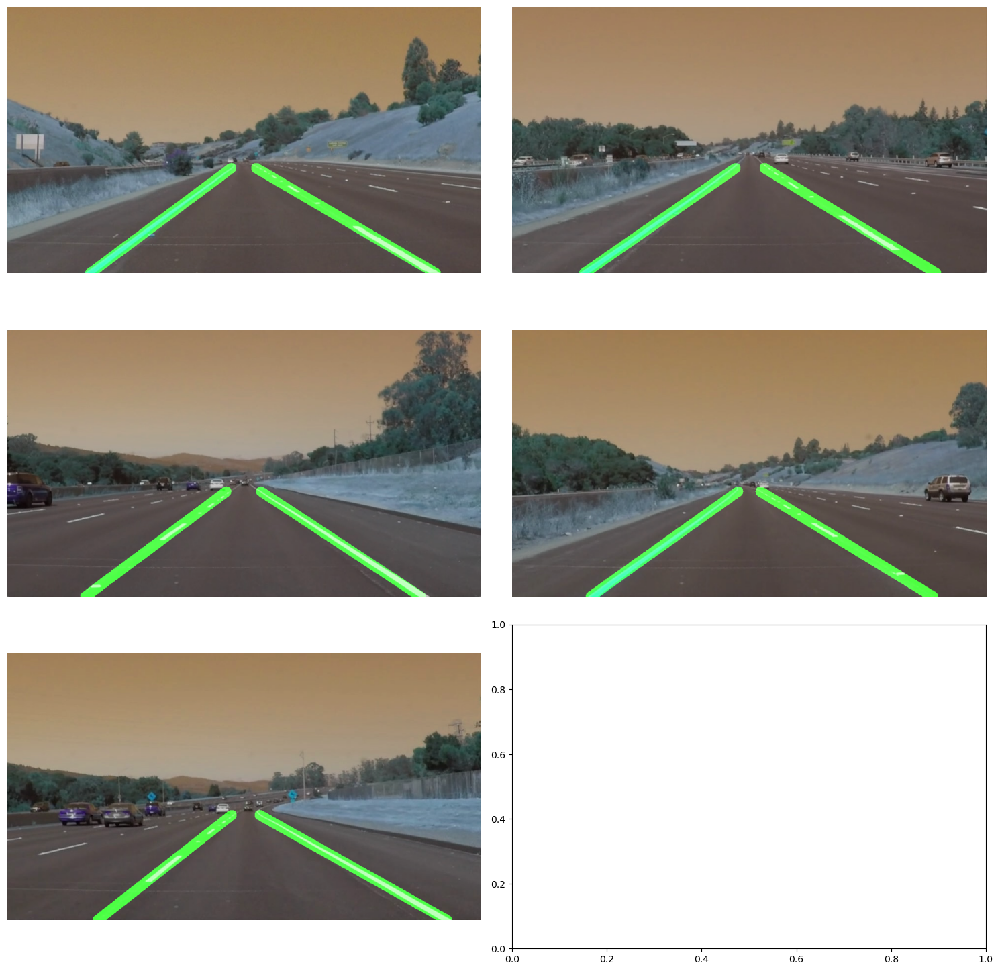

In [31]:
# Set 1 Final Output

plot_images(final_images_1)

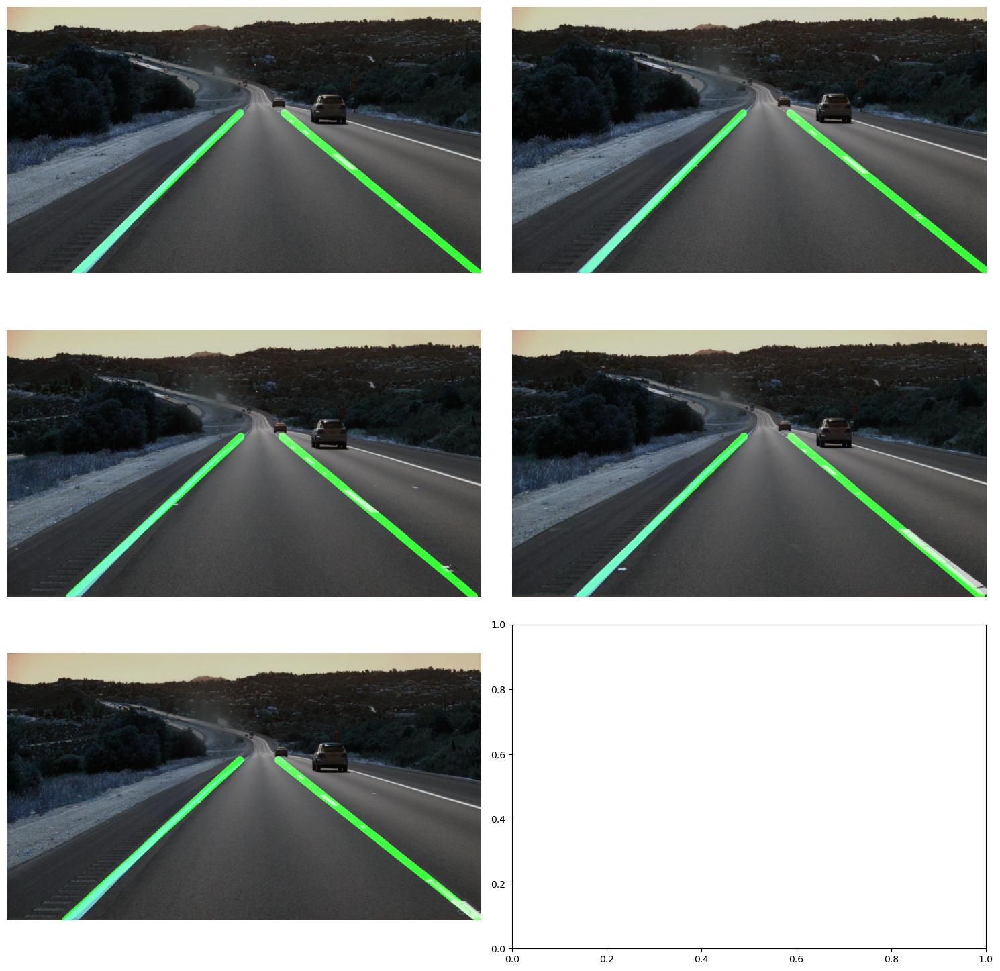

In [32]:
# Set 2 Final Output

plot_images(final_images_2)

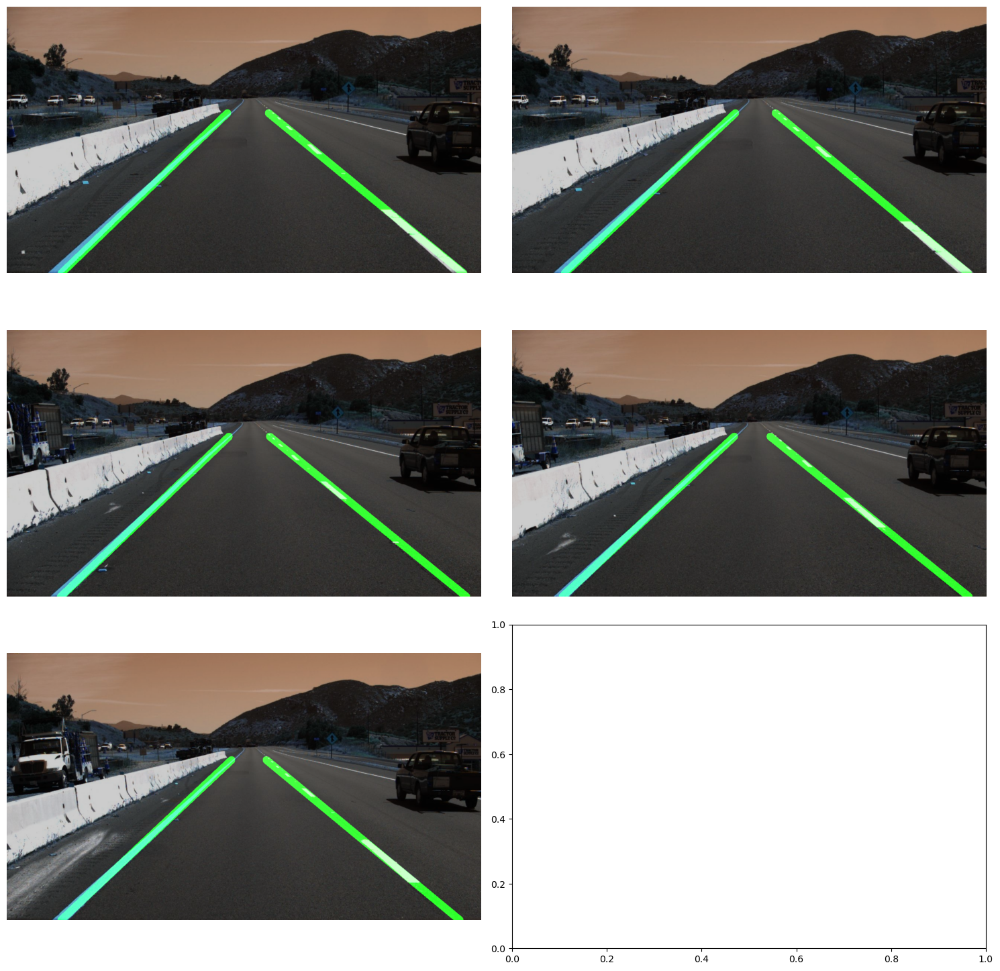

In [33]:
# Set 3 Final Output

plot_images(final_images_3)

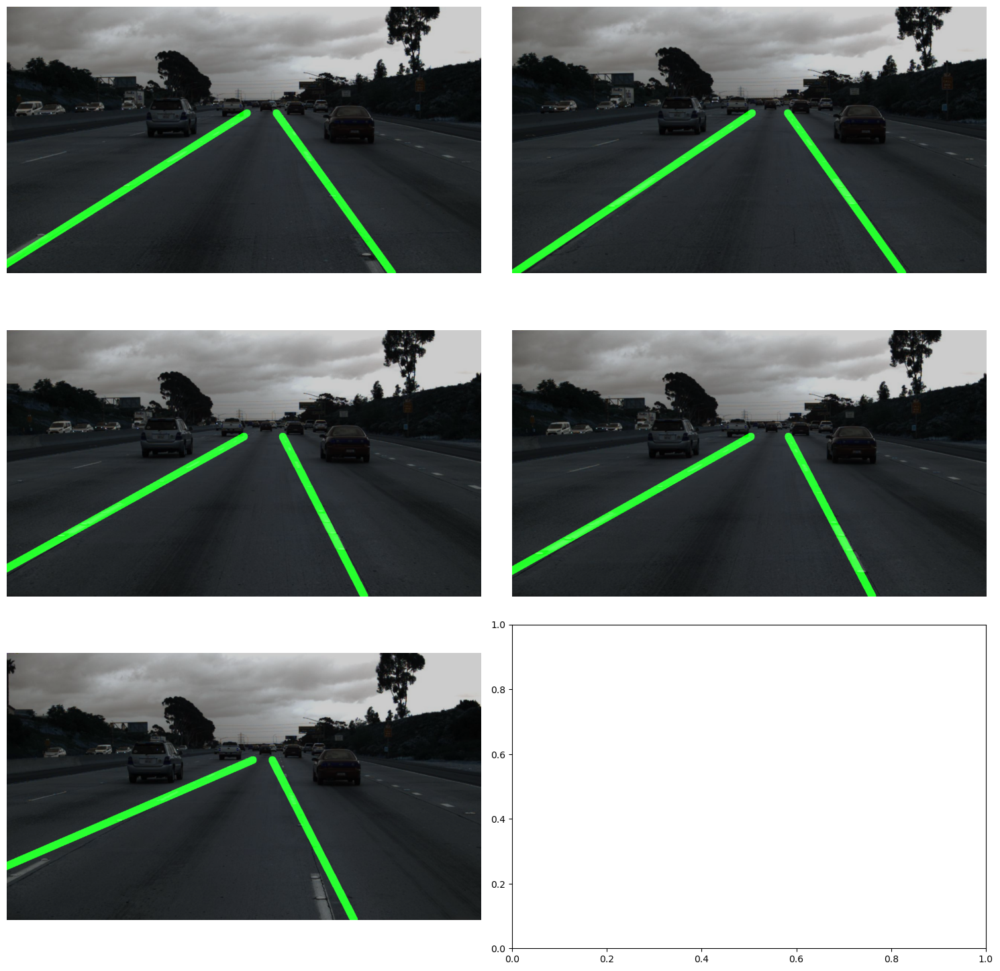

In [34]:
# Set 4 Final Output

plot_images(final_images_4)

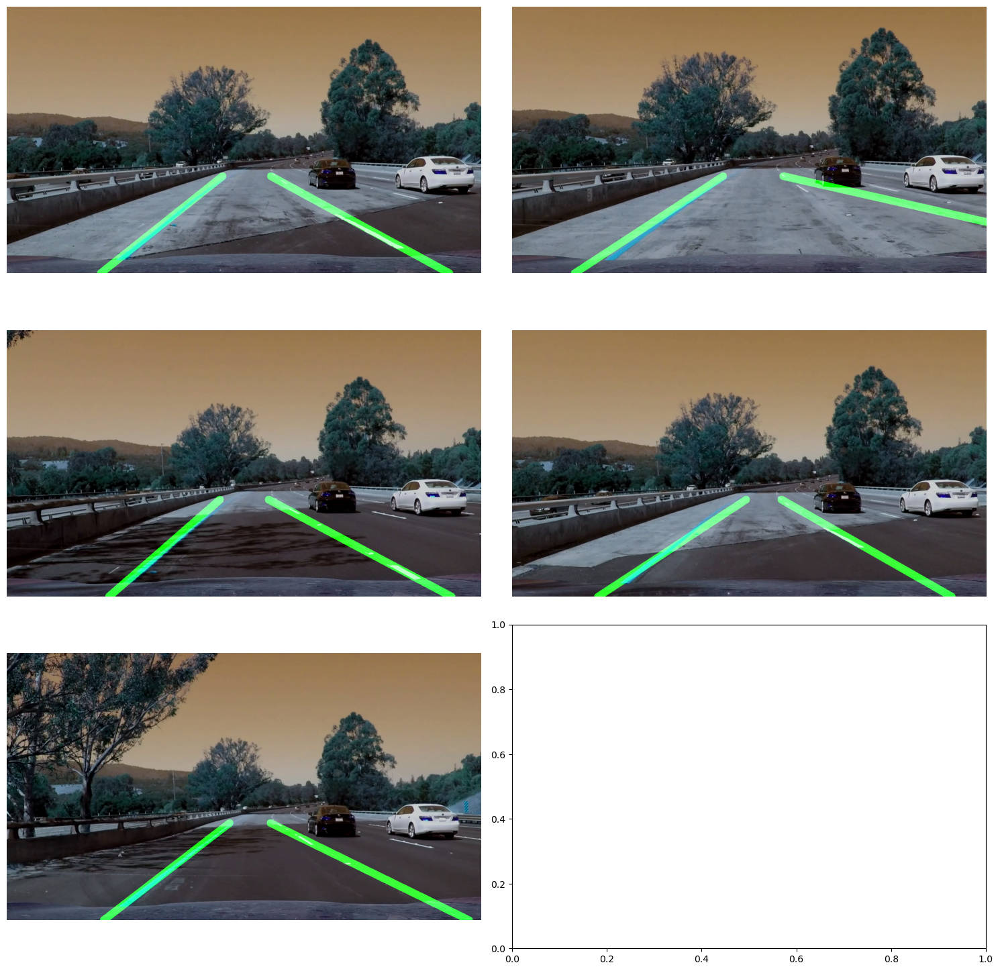

In [35]:
# Set 5 Final Output

plot_images(final_images_5)

## Summary of findings, and other remarks

Comment on the performance of the line detector: 
- In what scenarios (i.e. test sets) does it work well?

set 1, set 2, set 3 (bright lighting conditions, well defined lines, less to no noise in the image, no disturbances in the image).

- In what scenarios (i.e. test sets) does it not work?

set 4, set 5 (low lighting conditions, broken lines, shadows in the image, improper road surface, disturbances in the image).

- Comment on why this implementation does not work in some scenarios

More manual work [tuning parameters in almost every step to work for different images], the combinations i came up with may not work in all kinds of real world scenarios.

- Set 5 images are more challenging due to road surface and contrast changes. You may need to make your aproach more "sophisticated" to account for this.

Yes, the lines formed after region of interest detection were broken seperate lines, so I had to include dilate-erode step to compensate for this. Also others like disturbances on the road surface or low lighting were compensated by changing sigma size in blur and thresholds in edge detection.

- Vary the threshold parameters of the Canny edge detector, and comment on the impact on the lane detection performance

Tweaking the low threshold value to lower values causes more features to show up in edge detection which are not necessary. Tweaking the high threshold values to higher values caused the edges around the lanes to disappear, which are important for lane detection.

- Vary the parameters used by the cv2.HoughLinesP function (rho, theta, threshold etc), and comment on the impact on the lane detection performance

low threshold value detects unsteady lines which are not necessarily related to lanes. high threshold value detects more steady lines and ignores the unsteady ones.

I tried increasing rho value [2, 3 from 1] on set 1 images. The lines started converging and more inclined from the desired output

I tried different theta values [pi/90, pi/360]. Here also lines started becoming more inclined and converging from the desired output.

- Suggest methods to improve the performance of this lane detector. Specifically, consider how you would make the detector more robust against changes in contrast, lighting etc

Trying to make the blur kernel size, thresholds for canny edge detection, region of interest detection adoptive help improve the system. For contrast or lighting, I think we need to adopt some normalising method in preprocessing to eliminate issues.  